In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from math import atan2, degrees
%matplotlib inline

In [2]:
datacsi = pd.read_excel("csidata.xlsx", sheet_name="csibruto")
csisubcarrier = pd.read_excel("csidata.xlsx", sheet_name="csi_subportadoras")

In [3]:
datacsi.head()

,device,local,real0,im0,real1,im1,real2,im2,real3,im3,...,real123,im123,real124,im124,real125,im125,real126,im126,real127,im127
0,DIR,A1,102,-32,5,0,25,0,24,0,...,48,7,49,6,50,5,50,4,50,3
1,DIR,A1,126,97,23,0,-25,-5,-24,-4,...,-47,-14,-49,-13,-51,-12,-51,-10,-51,-9
2,DIR,A1,126,97,23,0,-5,25,-5,24,...,-17,46,-15,47,-14,49,-13,50,-11,51
3,DIR,A1,126,97,23,0,16,-19,15,-18,...,36,-34,36,-36,36,-37,35,-39,34,-39
4,DIR,A1,126,97,23,0,10,19,10,18,...,15,40,16,40,18,41,19,41,20,40


In [4]:
#datacsi.dtypes

In [5]:
csisubcarrier

,device,local,Amp_sub0,Fase_sub0,Amp_sub1,Fase_sub1,Amp_sub2,Fase_sub2,Amp_sub3,Fase_sub3,...,Amp_sub123,Fase_sub123,Amp_sub124,Fase_sub124,Amp_sub125,Fase_sub125,Amp_sub126,Fase_sub126,Amp_sub127,Fase_sub127


In [6]:
csisubcarrier.columns

Index(['device', 'local', 'Amp_sub0', 'Fase_sub0', 'Amp_sub1', 'Fase_sub1',
       'Amp_sub2', 'Fase_sub2', 'Amp_sub3', 'Fase_sub3',
       ...
       'Amp_sub123', 'Fase_sub123', 'Amp_sub124', 'Fase_sub124', 'Amp_sub125',
       'Fase_sub125', 'Amp_sub126', 'Fase_sub126', 'Amp_sub127',
       'Fase_sub127'],
      dtype='object', length=258)

In [7]:
csisubcarrier["device"] = datacsi["device"]
csisubcarrier["local"] = datacsi["local"]
csisubcarrier.head()

,device,local,Amp_sub0,Fase_sub0,Amp_sub1,Fase_sub1,Amp_sub2,Fase_sub2,Amp_sub3,Fase_sub3,...,Amp_sub123,Fase_sub123,Amp_sub124,Fase_sub124,Amp_sub125,Fase_sub125,Amp_sub126,Fase_sub126,Amp_sub127,Fase_sub127
0,DIR,A1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,DIR,A1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,DIR,A1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,DIR,A1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,DIR,A1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
#CONVERTE OS NÚMEROS COMPLEXOS RECEBIDOS EM AMPLITUDE E FASE
x=0
y=2
while(x<len(datacsi)):
    y=2
    while(y<len(datacsi.columns)):
        csisubcarrier[csisubcarrier.columns[y]][x] = (datacsi[datacsi.columns[y]][x]**2+datacsi[datacsi.columns[y+1]][x]**2)**(1/2)
        csisubcarrier[csisubcarrier.columns[y+1]][x] = degrees(atan2(datacsi[datacsi.columns[y+1]][x],datacsi[datacsi.columns[y]][x]))
        y=y+2
    x=x+1

In [9]:
# IMPORTANTE PARA CONSEGUIR PLOTAR POIS AO GERAR UM NOVO DF ELE FICA COMO OBJETOS!!!!!! PRECISA CONVERTER PARA O TIPO FLOAT!!!
csisubcarrier[csisubcarrier.columns[0:2:1]] = csisubcarrier[csisubcarrier.columns[0:2:1]].astype(str)
csisubcarrier[csisubcarrier.columns[2:len(csisubcarrier.columns):1]] = csisubcarrier[csisubcarrier.columns[2:len(csisubcarrier.columns):1]].astype(float)

In [10]:
# csisubcarrier.dtypes

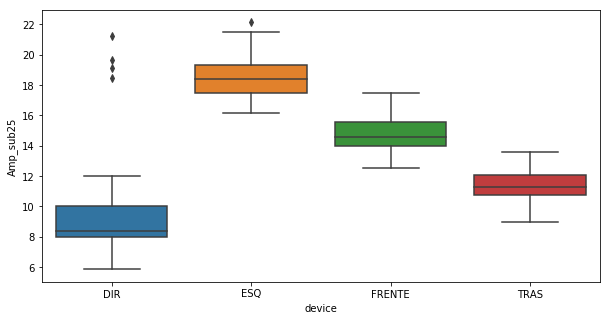

In [11]:
teste = csisubcarrier[csisubcarrier["local"]=="A3"]
# teste.head()
#teste.plot(use_index=True,y="Amp_sub15")
#teste.reset_index().head()
plt.figure(figsize=(10,5))
#fig = sns.boxplot(data=teste,orient="v")
sns.boxplot(x="device",y='Amp_sub25',data=teste)


Text(0.5, 1.0, 'Variação da amplitude de uma Subportadora em um unico dispositivo em diversos pontos')

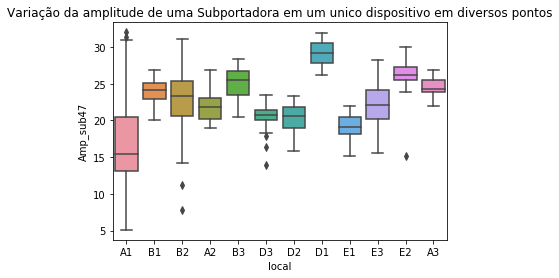

In [12]:
# teste = csisubcarrier[(csisubcarrier["device"]=="FRENTE") & (csisubcarrier["local"]=="A1")][csisubcarrier.columns[6:32:2]]
teste = csisubcarrier[csisubcarrier["device"]=="FRENTE"]
g= sns.boxplot(x="local",y='Amp_sub47',data=teste)
plt.title("Variação da amplitude de uma Subportadora em um unico dispositivo em diversos pontos")

Text(0.5, 1.0, 'Variação da amplitude de uma Subportadora em vários direções em diversos pontos')

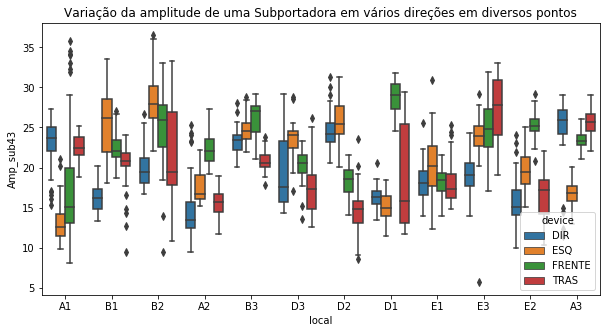

In [13]:
plt.figure(figsize=(10,5))
f = sns.boxplot(x="local",y='Amp_sub43',data=csisubcarrier,hue="device")
plt.title("Variação da amplitude de uma Subportadora em vários direções em diversos pontos")

In [14]:
csisubcarrier[csisubcarrier.columns[6:129:2]].head()

,Amp_sub2,Amp_sub3,Amp_sub4,Amp_sub5,Amp_sub6,Amp_sub7,Amp_sub8,Amp_sub9,Amp_sub10,Amp_sub11,...,Amp_sub54,Amp_sub55,Amp_sub56,Amp_sub57,Amp_sub58,Amp_sub59,Amp_sub60,Amp_sub61,Amp_sub62,Amp_sub63
0,25.000000,24.000000,22.000000,21.023796,20.099751,19.235384,17.464249,16.763055,16.155494,15.231546,...,21.540659,22.135944,22.803509,23.345235,24.186773,24.083189,25.079872,26.019224,26.019224,27.018512
1,25.495098,24.331050,24.331050,22.203603,21.095023,20.024984,19.000000,18.027756,17.117243,17.262677,...,22.472205,22.825424,24.166092,24.698178,25.298221,25.298221,25.961510,26.683328,27.658633,27.658633
2,25.495098,24.515301,23.345235,21.213203,20.099751,19.026298,18.000000,17.029386,16.124515,15.524175,...,22.472205,23.323808,23.706539,24.166092,24.698178,25.298221,26.248809,25.961510,26.925824,26.683328
3,24.839485,23.430749,22.803509,21.400935,20.248457,19.723083,17.888544,17.464249,16.155494,15.811388,...,22.472205,23.021729,22.803509,24.083189,24.758837,25.455844,26.172505,26.172505,27.658633,28.425341
4,21.470911,20.591260,19.235384,18.357560,16.643317,16.401219,14.866069,14.142136,13.453624,12.806248,...,19.026298,20.099751,20.396078,20.615528,20.880613,22.135944,22.472205,22.472205,23.769729,22.847319


Text(0, 0.5, 'Amplitude das Subportadoras')

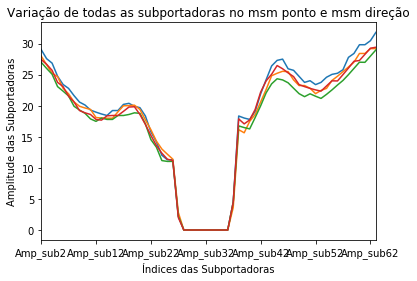

In [15]:
csisubcarrier[csisubcarrier.columns[6:129:2]].loc[1890].plot()
csisubcarrier[csisubcarrier.columns[6:129:2]].loc[1891].plot()
csisubcarrier[csisubcarrier.columns[6:129:2]].loc[1892].plot()
csisubcarrier[csisubcarrier.columns[6:129:2]].loc[1893].plot()
plt.title("Variação de todas as subportadoras no msm ponto e msm direção")
plt.xlabel("Índices das Subportadoras")
plt.ylabel("Amplitude das Subportadoras")

Text(0, 0.5, 'Amplitude das Subportadoras')

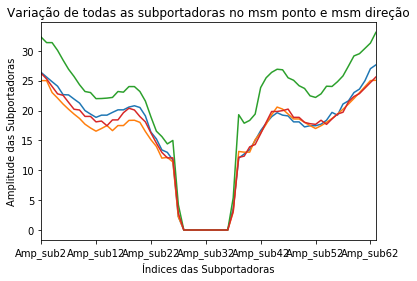

In [16]:
csisubcarrier[csisubcarrier.columns[6:129:2]].loc[320].plot()
csisubcarrier[csisubcarrier.columns[6:129:2]].loc[321].plot()
csisubcarrier[csisubcarrier.columns[6:129:2]].loc[322].plot()
csisubcarrier[csisubcarrier.columns[6:129:2]].loc[323].plot()
plt.title("Variação de todas as subportadoras no msm ponto e msm direção")
plt.xlabel("Índices das Subportadoras")
plt.ylabel("Amplitude das Subportadoras")

In [17]:
csisubcarrier.columns[2:129:2]

Index(['Amp_sub0', 'Amp_sub1', 'Amp_sub2', 'Amp_sub3', 'Amp_sub4', 'Amp_sub5',
       'Amp_sub6', 'Amp_sub7', 'Amp_sub8', 'Amp_sub9', 'Amp_sub10',
       'Amp_sub11', 'Amp_sub12', 'Amp_sub13', 'Amp_sub14', 'Amp_sub15',
       'Amp_sub16', 'Amp_sub17', 'Amp_sub18', 'Amp_sub19', 'Amp_sub20',
       'Amp_sub21', 'Amp_sub22', 'Amp_sub23', 'Amp_sub24', 'Amp_sub25',
       'Amp_sub26', 'Amp_sub27', 'Amp_sub28', 'Amp_sub29', 'Amp_sub30',
       'Amp_sub31', 'Amp_sub32', 'Amp_sub33', 'Amp_sub34', 'Amp_sub35',
       'Amp_sub36', 'Amp_sub37', 'Amp_sub38', 'Amp_sub39', 'Amp_sub40',
       'Amp_sub41', 'Amp_sub42', 'Amp_sub43', 'Amp_sub44', 'Amp_sub45',
       'Amp_sub46', 'Amp_sub47', 'Amp_sub48', 'Amp_sub49', 'Amp_sub50',
       'Amp_sub51', 'Amp_sub52', 'Amp_sub53', 'Amp_sub54', 'Amp_sub55',
       'Amp_sub56', 'Amp_sub57', 'Amp_sub58', 'Amp_sub59', 'Amp_sub60',
       'Amp_sub61', 'Amp_sub62', 'Amp_sub63'],
      dtype='object')

In [18]:
colunas = np.arange(2, 129, 2)
str = csisubcarrier.columns[colunas[0]]
print(str)

Amp_sub0


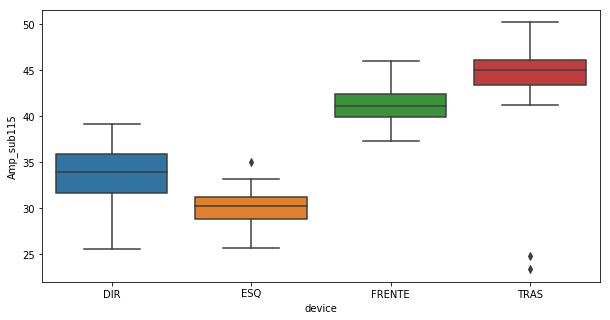

In [19]:
teste = csisubcarrier[csisubcarrier["local"]=="A3"]
# teste.head()
#teste.plot(use_index=True,y="Amp_sub15")
#teste.reset_index().head()
plt.figure(figsize=(10,5))
#fig = sns.boxplot(data=teste,orient="v")
sns.boxplot(x="device",y='Amp_sub115',data=teste)


Text(0, 0.5, 'Amplitude das Subportadoras')

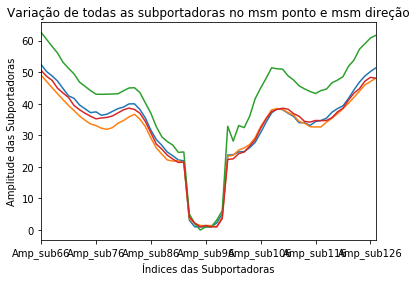

In [20]:
csisubcarrier[csisubcarrier.columns[134:len(csisubcarrier.columns):2]].loc[320].plot()
csisubcarrier[csisubcarrier.columns[134:len(csisubcarrier.columns):2]].loc[321].plot()
csisubcarrier[csisubcarrier.columns[134:len(csisubcarrier.columns):2]].loc[322].plot()
csisubcarrier[csisubcarrier.columns[134:len(csisubcarrier.columns):2]].loc[323].plot()
plt.title("Variação de todas as subportadoras no msm ponto e msm direção")
plt.xlabel("Índices das Subportadoras")
plt.ylabel("Amplitude das Subportadoras")

Text(0, 0.5, 'Amplitude das Subportadoras')

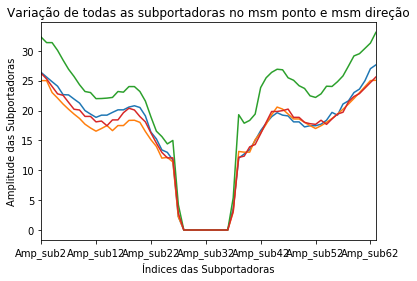

In [21]:
csisubcarrier[csisubcarrier.columns[6:129:2]].loc[320].plot()
csisubcarrier[csisubcarrier.columns[6:129:2]].loc[321].plot()
csisubcarrier[csisubcarrier.columns[6:129:2]].loc[322].plot()
csisubcarrier[csisubcarrier.columns[6:129:2]].loc[323].plot()
plt.title("Variação de todas as subportadoras no msm ponto e msm direção")
plt.xlabel("Índices das Subportadoras")
plt.ylabel("Amplitude das Subportadoras")

In [22]:
#Faz a lista das colunas correspondentes à Fase, que serão desconsideradas!
lista_drop_fases = csisubcarrier.columns[3:len(csisubcarrier.columns):2]
#Retira essas colunas restando apenas as colunas das amplitudes das subportadoras
csisubcarrier.drop(lista_drop_fases,axis=1, inplace=True)


In [23]:
#Deve-se reordenar as colunas pois a ordem das subportadoras recebidas é: 0~31,-32~-1
csisubcarrier.head()

,device,local,Amp_sub0,Amp_sub1,Amp_sub2,Amp_sub3,Amp_sub4,Amp_sub5,Amp_sub6,Amp_sub7,...,Amp_sub118,Amp_sub119,Amp_sub120,Amp_sub121,Amp_sub122,Amp_sub123,Amp_sub124,Amp_sub125,Amp_sub126,Amp_sub127
0,DIR,A1,106.901824,5.0,25.000000,24.000000,22.000000,21.023796,20.099751,19.235384,...,41.231056,42.379240,43.680659,45.122057,46.690470,48.507731,49.365980,50.249378,50.159745,50.089919
1,DIR,A1,159.012578,23.0,25.495098,24.331050,24.331050,22.203603,21.095023,20.024984,...,42.190046,43.829214,44.777226,45.880279,47.434165,49.040799,50.695167,52.392748,51.971146,51.788030
2,DIR,A1,159.012578,23.0,25.495098,24.515301,23.345235,21.213203,20.099751,19.026298,...,43.011626,43.566042,44.294469,46.518813,47.539457,49.040799,49.335586,50.960769,51.662365,52.172790
3,DIR,A1,159.012578,23.0,24.839485,23.430749,22.803509,21.400935,20.248457,19.723083,...,43.046487,44.102154,45.000000,45.453273,47.423623,49.517674,50.911688,51.623638,52.402290,51.739733
4,DIR,A1,159.012578,23.0,21.470911,20.591260,19.235384,18.357560,16.643317,16.401219,...,37.054015,38.327536,38.832976,40.261644,41.109610,42.720019,43.081318,44.777226,45.188494,44.721360


In [24]:
#Separa todos os dados em DFs separados
begindf = csisubcarrier[csisubcarrier.columns[0:2:1]].copy()
possubLLTF = csisubcarrier[csisubcarrier.columns[2:34:1]].copy()
negsubLLTF = csisubcarrier[csisubcarrier.columns[34:66:1]].copy()
possubHTLTF = csisubcarrier[csisubcarrier.columns[66:98:1]].copy()
negsubHTLTF = csisubcarrier[csisubcarrier.columns[98:130:1]].copy()
organized_csi_df = pd.concat([begindf,negsubLLTF,possubLLTF,negsubHTLTF,possubHTLTF],axis=1)
organized_csi_df.head()

,device,local,Amp_sub32,Amp_sub33,Amp_sub34,Amp_sub35,Amp_sub36,Amp_sub37,Amp_sub38,Amp_sub39,...,Amp_sub86,Amp_sub87,Amp_sub88,Amp_sub89,Amp_sub90,Amp_sub91,Amp_sub92,Amp_sub93,Amp_sub94,Amp_sub95
0,DIR,A1,0.0,0.0,0.0,0.0,0.0,4.123106,15.297059,16.124515,...,22.090722,19.000000,17.029386,15.132746,14.560220,12.806248,13.601471,2.236068,0.000000,1.414214
1,DIR,A1,0.0,0.0,0.0,0.0,0.0,5.000000,17.029386,17.117243,...,24.083189,22.203603,19.416488,17.720045,17.464249,15.620499,15.000000,3.605551,2.236068,0.000000
2,DIR,A1,0.0,0.0,0.0,0.0,0.0,4.000000,17.029386,17.117243,...,21.023796,18.110770,17.464249,15.811388,14.317821,13.453624,12.806248,2.236068,1.000000,1.414214
3,DIR,A1,0.0,0.0,0.0,0.0,0.0,4.123106,17.464249,17.492856,...,21.954498,19.416488,17.029386,15.556349,15.000000,12.649111,12.041595,2.000000,0.000000,1.000000
4,DIR,A1,0.0,0.0,0.0,0.0,0.0,3.162278,14.866069,15.524175,...,20.000000,17.492856,15.231546,13.601471,13.152946,13.038405,12.369317,2.236068,1.000000,1.414214


In [25]:
#Alterar o nome das colunas!!!!!!
colunas_novas = ["device","local","LLTF_-32","LLTF_-31","LLTF_-30","LLTF_-29","LLTF_-28","LLTF_-27","LLTF_-26","LLTF_-25","LLTF_-24","LLTF_-23","LLTF_-22","LLTF_-21","LLTF_-20","LLTF_-19","LLTF_-18","LLTF_-17","LLTF_-16","LLTF_-15","LLTF_-14","LLTF_-13","LLTF_-12","LLTF_-11","LLTF_-10","LLTF_-9","LLTF_-8","LLTF_-7","LLTF_-6","LLTF_-5","LLTF_-4","LLTF_-3","LLTF_-2","LLTF_-1","LLTF_0","LLTF_1","LLTF_2","LLTF_3","LLTF_4","LLTF_5","LLTF_6","LLTF_7","LLTF_8","LLTF_9","LLTF_10","LLTF_11","LLTF_12","LLTF_13","LLTF_14","LLTF_15","LLTF_16","LLTF_17","LLTF_18","LLTF_19","LLTF_20","LLTF_21","LLTF_22","LLTF_23","LLTF_24","LLTF_25","LLTF_26","LLTF_27","LLTF_28","LLTF_29","LLTF_30","LLTF_31","HTLTF_-32","HTLTF_-31","HTLTF_-30","HTLTF_-29","HTLTF_-28","HTLTF_-27","HTLTF_-26","HTLTF_-25","HTLTF_-24","HTLTF_-23","HTLTF_-22","HTLTF_-21","HTLTF_-20","HTLTF_-19","HTLTF_-18","HTLTF_-17","HTLTF_-16","HTLTF_-15","HTLTF_-14","HTLTF_-13","HTLTF_-12","HTLTF_-11","HTLTF_-10","HTLTF_-9","HTLTF_-8","HTLTF_-7","HTLTF_-6","HTLTF_-5","HTLTF_-4","HTLTF_-3","HTLTF_-2","HTLTF_-1","HTLTF_0","HTLTF_1","HTLTF_2","HTLTF_3","HTLTF_4","HTLTF_5","HTLTF_6","HTLTF_7","HTLTF_8","HTLTF_9","HTLTF_10","HTLTF_11","HTLTF_12","HTLTF_13","HTLTF_14","HTLTF_15","HTLTF_16","HTLTF_17","HTLTF_18","HTLTF_19","HTLTF_20","HTLTF_21","HTLTF_22","HTLTF_23","HTLTF_24","HTLTF_25","HTLTF_26","HTLTF_27","HTLTF_28","HTLTF_29","HTLTF_30","HTLTF_31"]
organized_csi_df.columns = colunas_novas
organized_csi_df.head()

,device,local,LLTF_-32,LLTF_-31,LLTF_-30,LLTF_-29,LLTF_-28,LLTF_-27,LLTF_-26,LLTF_-25,...,HTLTF_22,HTLTF_23,HTLTF_24,HTLTF_25,HTLTF_26,HTLTF_27,HTLTF_28,HTLTF_29,HTLTF_30,HTLTF_31
0,DIR,A1,0.0,0.0,0.0,0.0,0.0,4.123106,15.297059,16.124515,...,22.090722,19.000000,17.029386,15.132746,14.560220,12.806248,13.601471,2.236068,0.000000,1.414214
1,DIR,A1,0.0,0.0,0.0,0.0,0.0,5.000000,17.029386,17.117243,...,24.083189,22.203603,19.416488,17.720045,17.464249,15.620499,15.000000,3.605551,2.236068,0.000000
2,DIR,A1,0.0,0.0,0.0,0.0,0.0,4.000000,17.029386,17.117243,...,21.023796,18.110770,17.464249,15.811388,14.317821,13.453624,12.806248,2.236068,1.000000,1.414214
3,DIR,A1,0.0,0.0,0.0,0.0,0.0,4.123106,17.464249,17.492856,...,21.954498,19.416488,17.029386,15.556349,15.000000,12.649111,12.041595,2.000000,0.000000,1.000000
4,DIR,A1,0.0,0.0,0.0,0.0,0.0,3.162278,14.866069,15.524175,...,20.000000,17.492856,15.231546,13.601471,13.152946,13.038405,12.369317,2.236068,1.000000,1.414214


In [26]:
#Escrever no excell
#Esse arquivo criado já tem as amplitudes das subportadoras já ordenadas corretamente e está pronto para ser utilizado!
organized_csi_df.to_excel("subcarriers_amplitude.xlsx", sheet_name="subcarriers_amplitude")

In [27]:
organized_csi_df = pd.read_excel("subcarriers_amplitude.xlsx", sheet_name="subcarriers_amplitude")
organized_csi_df.head()

,Unnamed: 0,device,local,LLTF_-32,LLTF_-31,LLTF_-30,LLTF_-29,LLTF_-28,LLTF_-27,LLTF_-26,...,HTLTF_22,HTLTF_23,HTLTF_24,HTLTF_25,HTLTF_26,HTLTF_27,HTLTF_28,HTLTF_29,HTLTF_30,HTLTF_31
0,0,DIR,A1,0,0,0,0,0,4.123106,15.297059,...,22.090722,19.000000,17.029386,15.132746,14.560220,12.806248,13.601471,2.236068,0.000000,1.414214
1,1,DIR,A1,0,0,0,0,0,5.000000,17.029386,...,24.083189,22.203603,19.416488,17.720045,17.464249,15.620499,15.000000,3.605551,2.236068,0.000000
2,2,DIR,A1,0,0,0,0,0,4.000000,17.029386,...,21.023796,18.110770,17.464249,15.811388,14.317821,13.453624,12.806248,2.236068,1.000000,1.414214
3,3,DIR,A1,0,0,0,0,0,4.123106,17.464249,...,21.954498,19.416488,17.029386,15.556349,15.000000,12.649111,12.041595,2.000000,0.000000,1.000000
4,4,DIR,A1,0,0,0,0,0,3.162278,14.866069,...,20.000000,17.492856,15.231546,13.601471,13.152946,13.038405,12.369317,2.236068,1.000000,1.414214


In [28]:
organized_csi_df.drop("Unnamed: 0",axis=1,inplace=True)
organized_csi_df.drop("LLTF_0",axis=1,inplace=True)
organized_csi_df.drop("LLTF_1",axis=1,inplace=True)
organized_csi_df.head()

,device,local,LLTF_-32,LLTF_-31,LLTF_-30,LLTF_-29,LLTF_-28,LLTF_-27,LLTF_-26,LLTF_-25,...,HTLTF_22,HTLTF_23,HTLTF_24,HTLTF_25,HTLTF_26,HTLTF_27,HTLTF_28,HTLTF_29,HTLTF_30,HTLTF_31
0,DIR,A1,0,0,0,0,0,4.123106,15.297059,16.124515,...,22.090722,19.000000,17.029386,15.132746,14.560220,12.806248,13.601471,2.236068,0.000000,1.414214
1,DIR,A1,0,0,0,0,0,5.000000,17.029386,17.117243,...,24.083189,22.203603,19.416488,17.720045,17.464249,15.620499,15.000000,3.605551,2.236068,0.000000
2,DIR,A1,0,0,0,0,0,4.000000,17.029386,17.117243,...,21.023796,18.110770,17.464249,15.811388,14.317821,13.453624,12.806248,2.236068,1.000000,1.414214
3,DIR,A1,0,0,0,0,0,4.123106,17.464249,17.492856,...,21.954498,19.416488,17.029386,15.556349,15.000000,12.649111,12.041595,2.000000,0.000000,1.000000
4,DIR,A1,0,0,0,0,0,3.162278,14.866069,15.524175,...,20.000000,17.492856,15.231546,13.601471,13.152946,13.038405,12.369317,2.236068,1.000000,1.414214


Text(0, 0.5, 'Amplitude das Subportadoras')

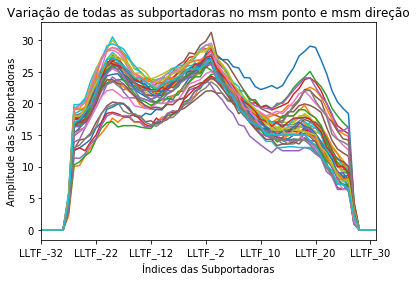

In [29]:
for x in range(40):
    organized_csi_df[organized_csi_df.columns[2:64:1]].loc[x].plot()
plt.title("Variação de todas as subportadoras no msm ponto e msm direção")
plt.xlabel("Índices das Subportadoras")
plt.ylabel("Amplitude das Subportadoras")

In [30]:
# organized_csi_df[organized_csi_df.columns[2:66:1]].loc[1].plot(legend=True)
# organized_csi_df[organized_csi_df.columns[2:66:1]].loc[2].plot(legend=True)
# organized_csi_df[organized_csi_df.columns[2:66:1]].loc[3].plot(legend=True)
# organized_csi_df[organized_csi_df.columns[2:66:1]].loc[4].plot(legend=True)
# plt.title("Variação de todas as subportadoras no msm ponto e msm direção")
# plt.xlabel("Índices das Subportadoras")
# plt.ylabel("Amplitude das Subportadoras")

Text(0, 0.5, 'Amplitude das Subportadoras')

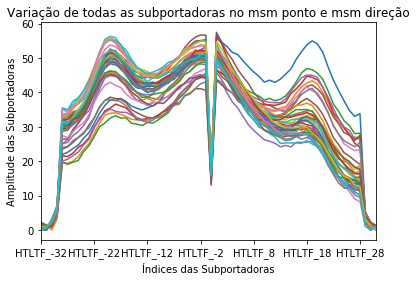

In [31]:
for x in range(40):
    organized_csi_df[organized_csi_df.columns[64:len(organized_csi_df.columns):1]].loc[x].plot()
plt.title("Variação de todas as subportadoras no msm ponto e msm direção")
plt.xlabel("Índices das Subportadoras")
plt.ylabel("Amplitude das Subportadoras")


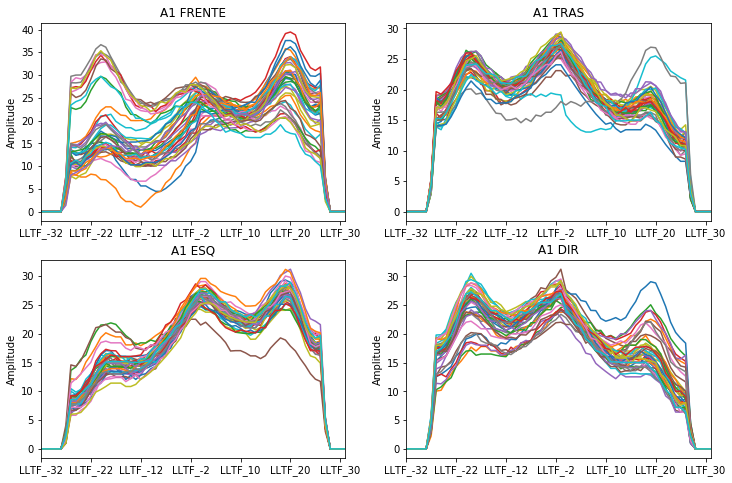

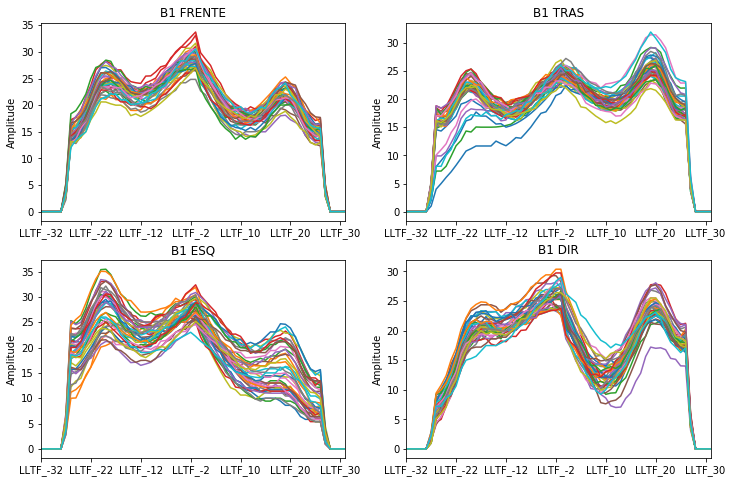

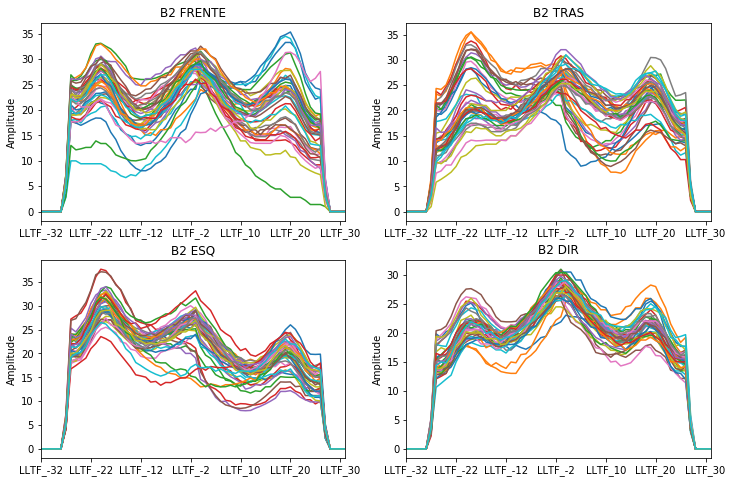

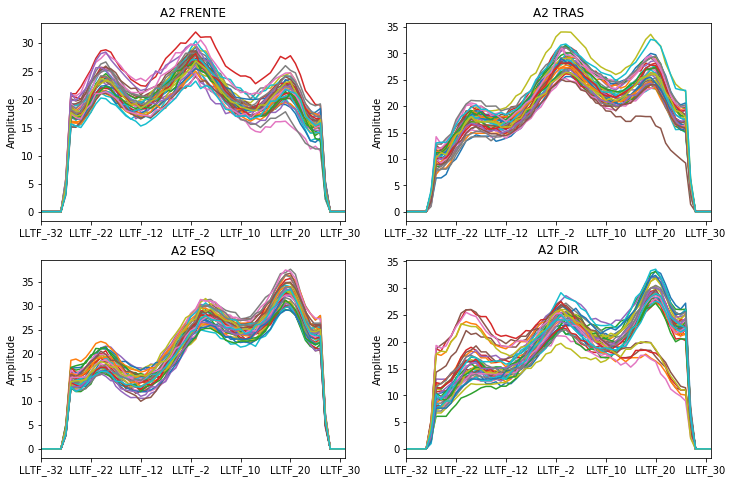

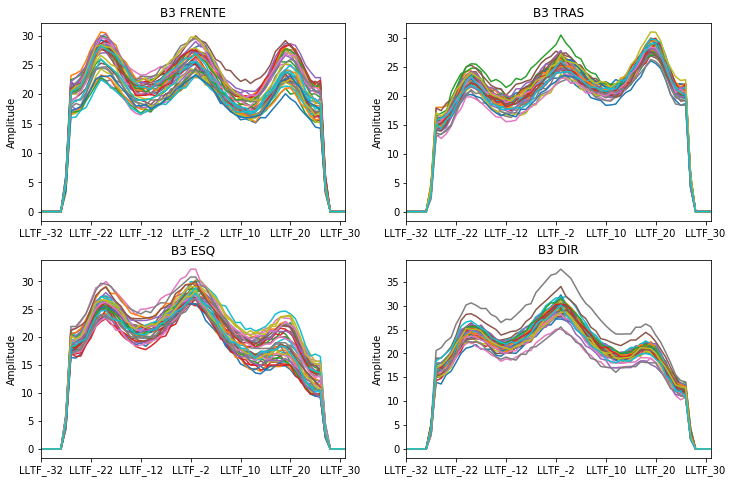

...

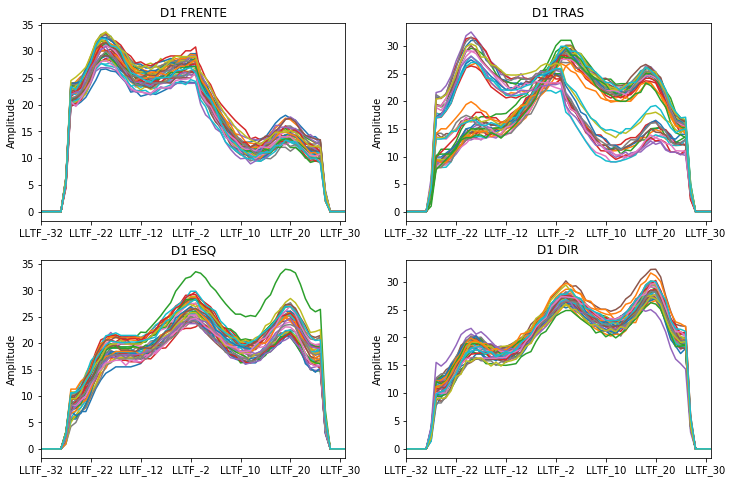

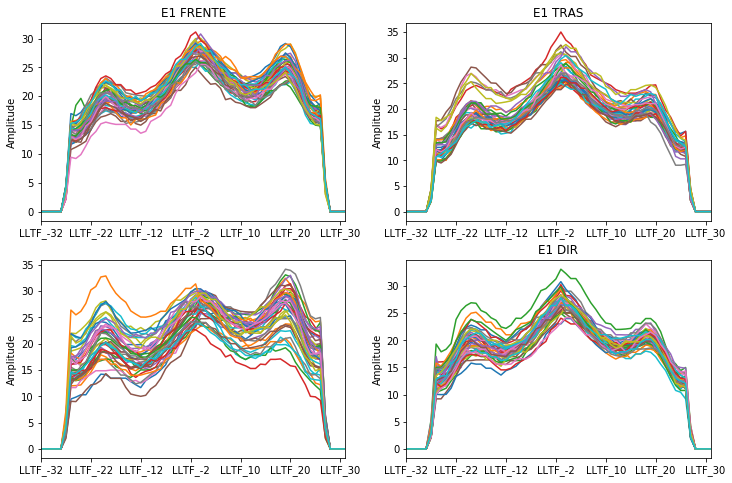

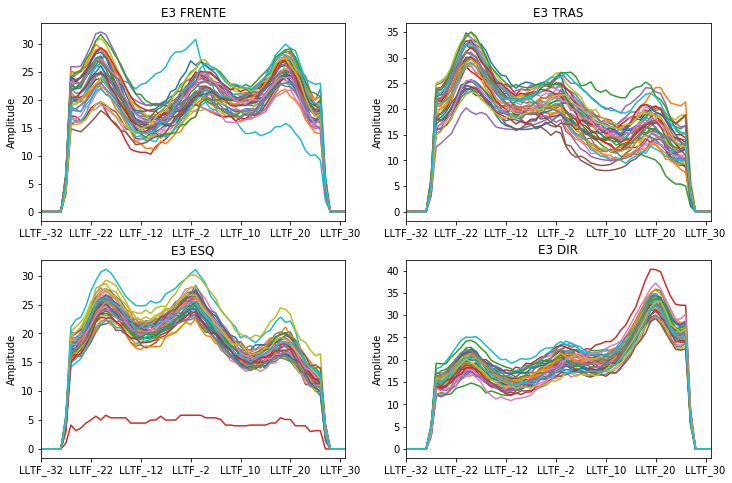

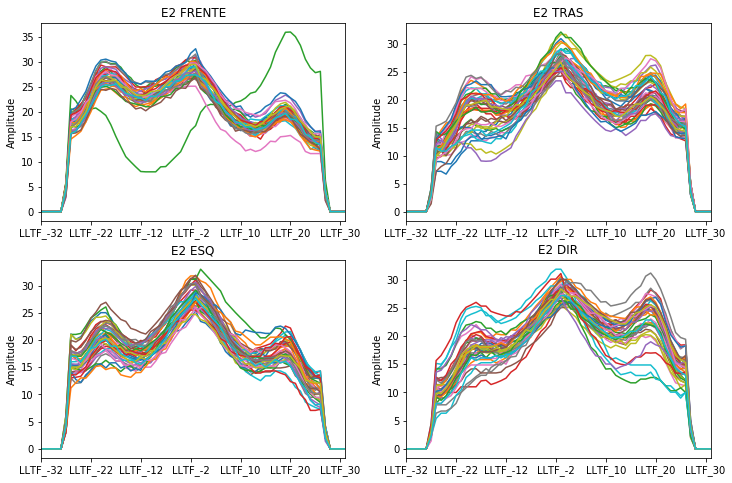

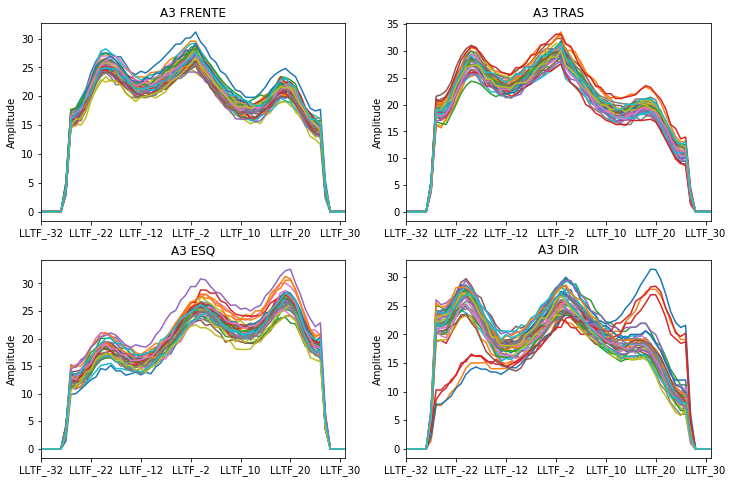

In [32]:
#LLTF
for w in organized_csi_df["local"].unique():
    data = organized_csi_df[organized_csi_df["local"]==w]
    data_frente = data[data["device"]=="FRENTE"]
    data_tras = data[data["device"]=="TRAS"]
    data_esq = data[data["device"]=="ESQ"]
    data_dir = data[data["device"]=="DIR"]
    fig, axes = plt.subplots(nrows=2, ncols=2,figsize=(12,8))
    for x in data_frente.index:
        data[data.columns[2:64:1]].loc[x].plot(ax=axes[0,0])
    axes[0,0].set_ylabel("Amplitude")
    axes[0,0].set_title(w +" FRENTE")
    for x in data_tras.index:
        data[data.columns[2:64:1]].loc[x].plot(ax=axes[0,1])
    axes[0,1].set_ylabel("Amplitude")
    axes[0,1].set_title(w +" TRAS")
    for x in data_esq.index:
        data[data.columns[2:64:1]].loc[x].plot(ax=axes[1,0])
    axes[1,0].set_ylabel("Amplitude")
    axes[1,0].set_title(w +" ESQ")
    for x in data_dir.index:
        data[data.columns[2:64:1]].loc[x].plot(ax=axes[1,1])
    axes[1,1].set_ylabel("Amplitude")
    axes[1,1].set_title(w +" DIR")

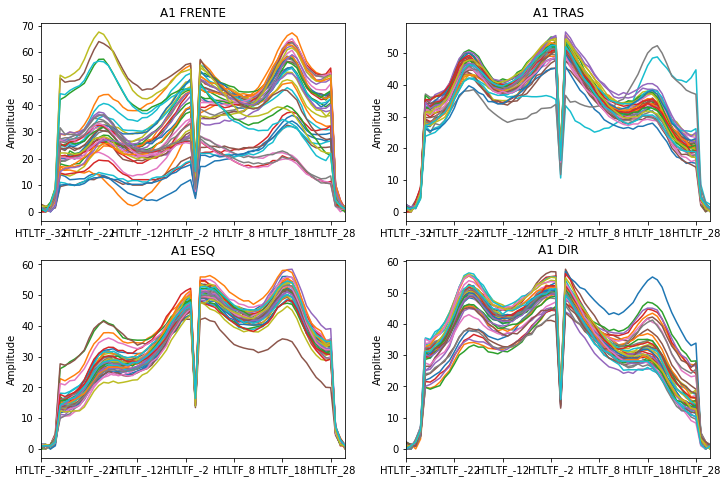

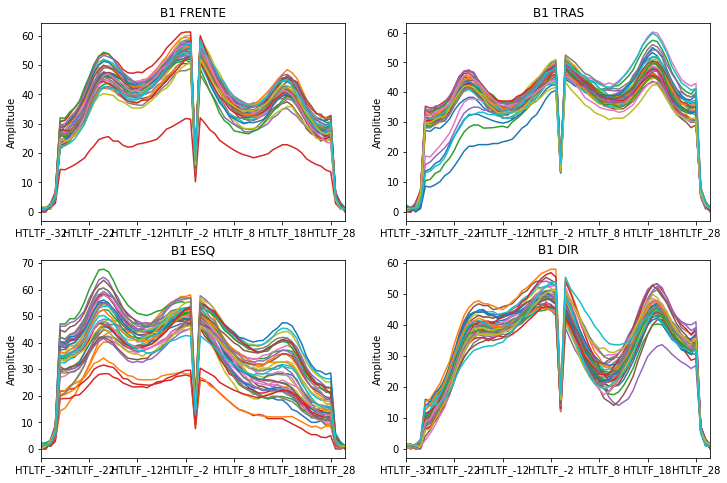

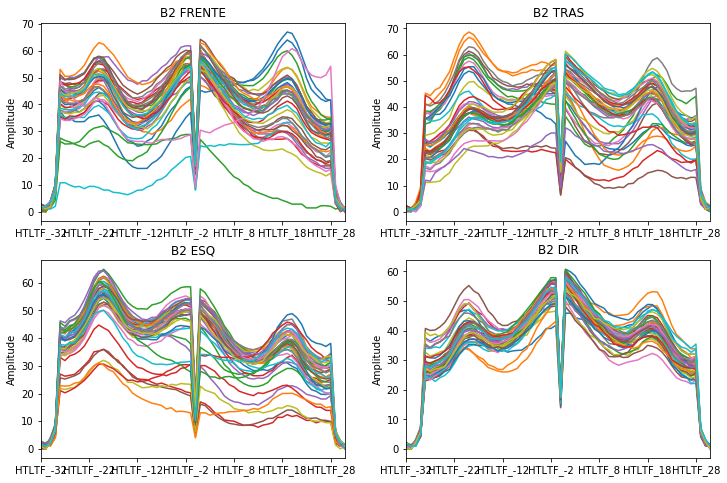

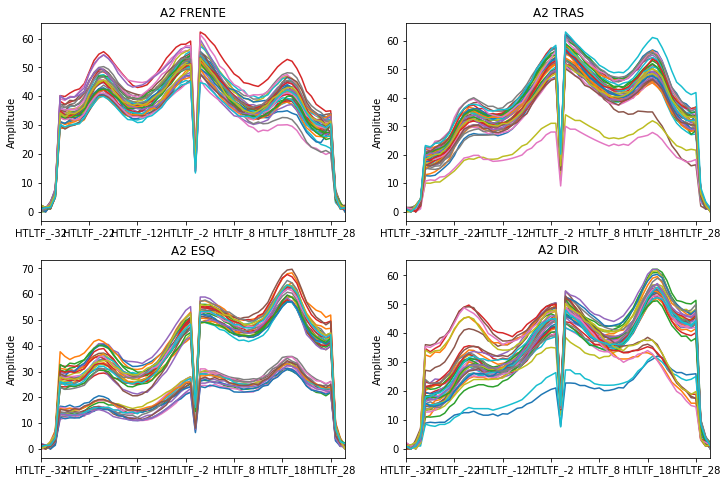

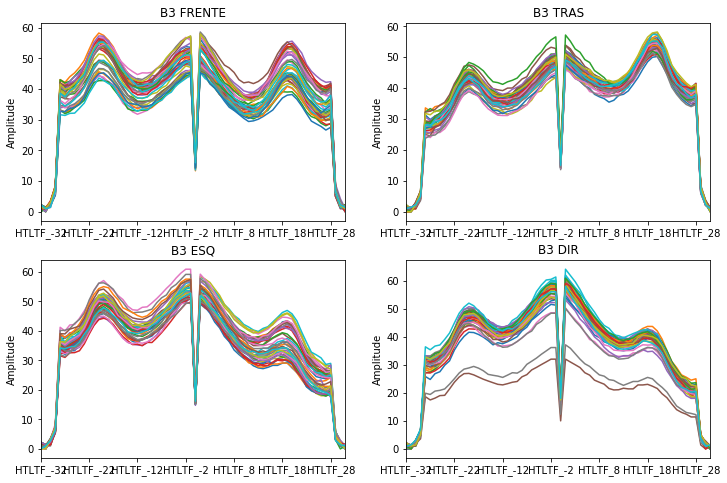

...

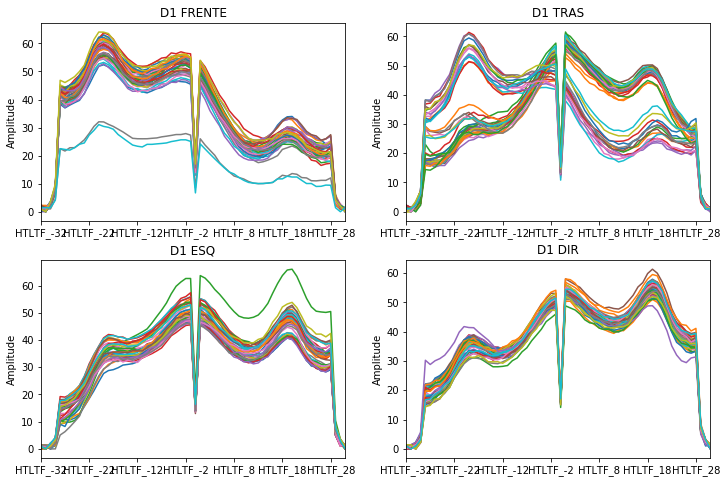

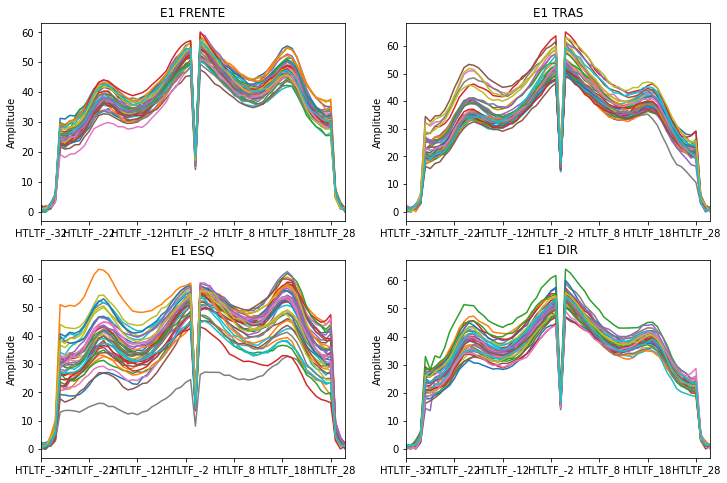

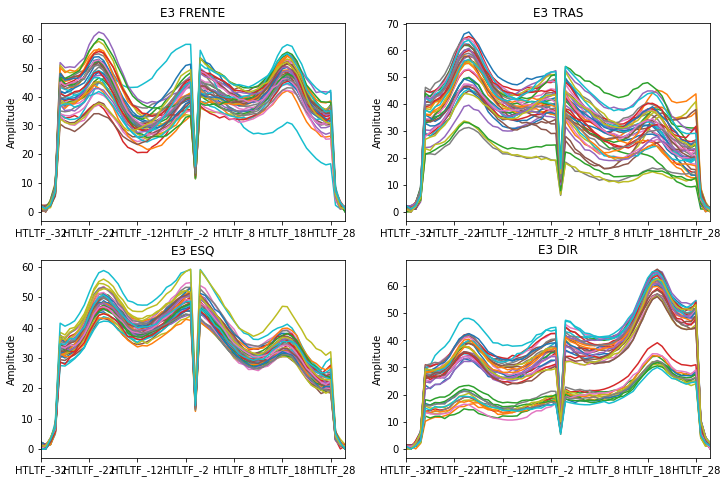

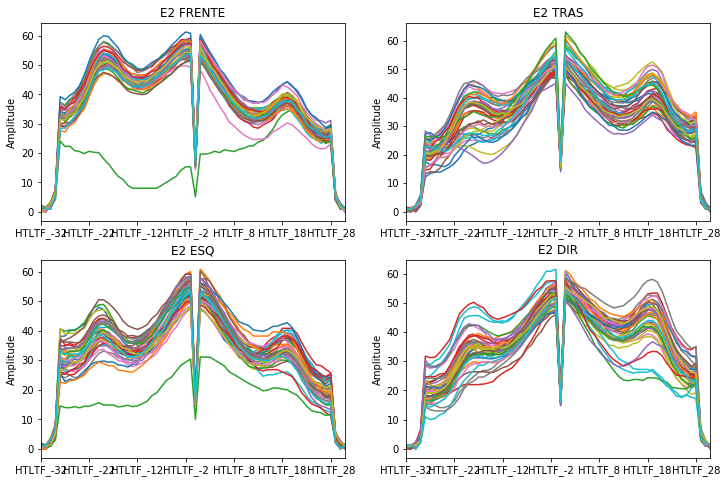

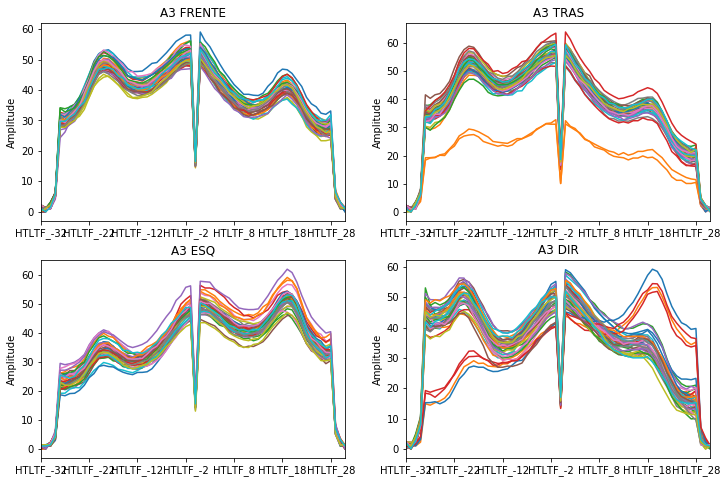

In [33]:
for w in organized_csi_df["local"].unique():
    data = organized_csi_df[organized_csi_df["local"]==w]
    data_frente = data[data["device"]=="FRENTE"]
    data_tras = data[data["device"]=="TRAS"]
    data_esq = data[data["device"]=="ESQ"]
    data_dir = data[data["device"]=="DIR"]
    fig, axes = plt.subplots(nrows=2, ncols=2,figsize=(12,8))
    for x in data_frente.index:
        data[data.columns[64:len(data.columns):1]].loc[x].plot(ax=axes[0,0])
    axes[0,0].set_ylabel("Amplitude")
    axes[0,0].set_title(w +" FRENTE")
    for x in data_tras.index:
        data[data.columns[64:len(data.columns):1]].loc[x].plot(ax=axes[0,1])
    axes[0,1].set_ylabel("Amplitude")
    axes[0,1].set_title(w +" TRAS")
    for x in data_esq.index:
        data[data.columns[64:len(data.columns):1]].loc[x].plot(ax=axes[1,0])
    axes[1,0].set_ylabel("Amplitude")
    axes[1,0].set_title(w +" ESQ")
    for x in data_dir.index:
        data[data.columns[64:len(data.columns):1]].loc[x].plot(ax=axes[1,1])
    axes[1,1].set_ylabel("Amplitude")
    axes[1,1].set_title(w +" DIR")

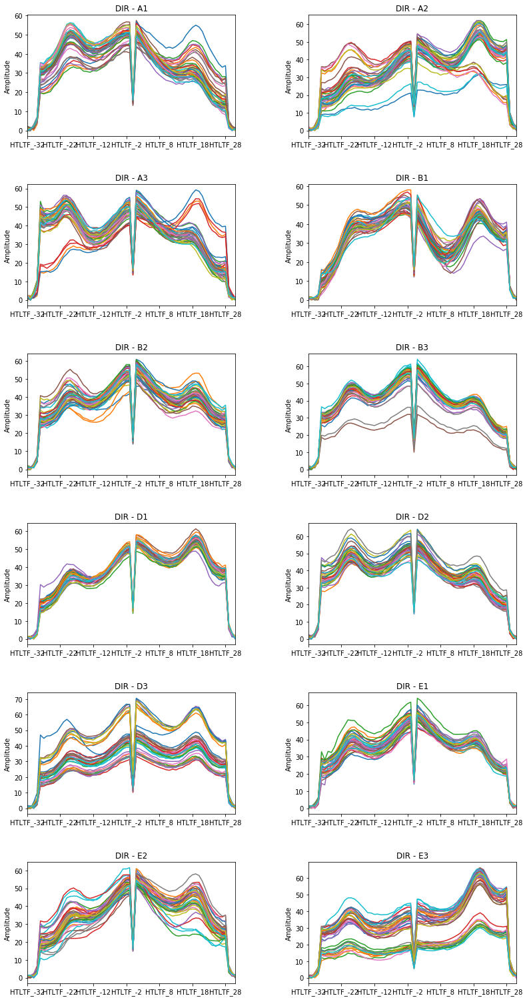

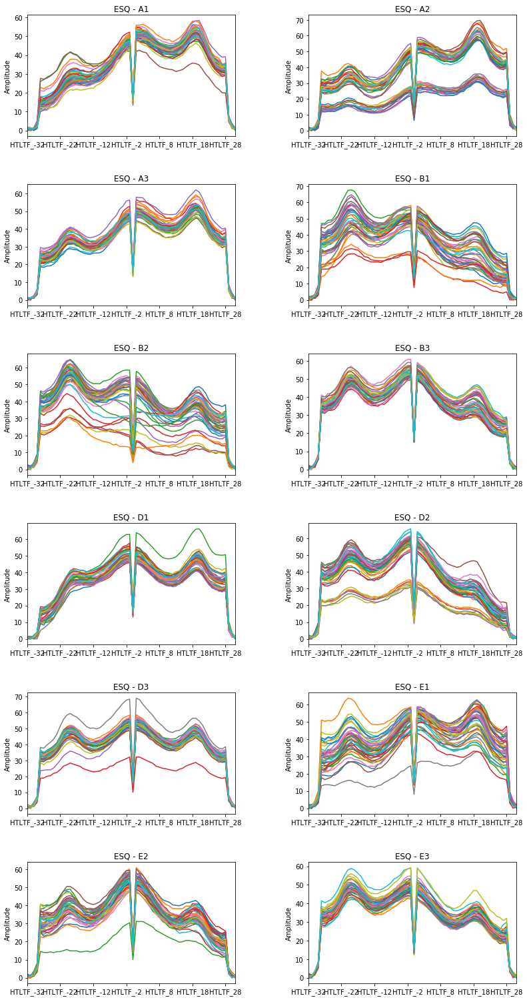

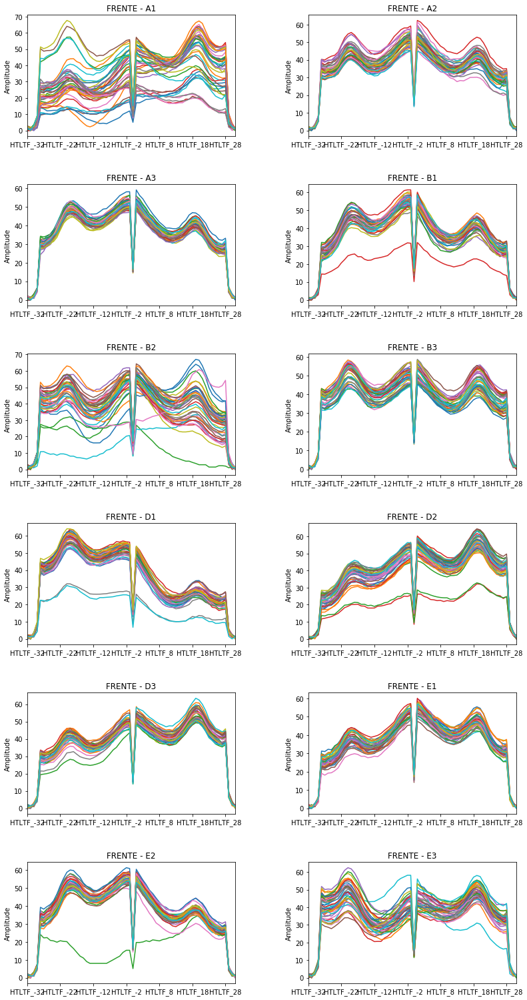

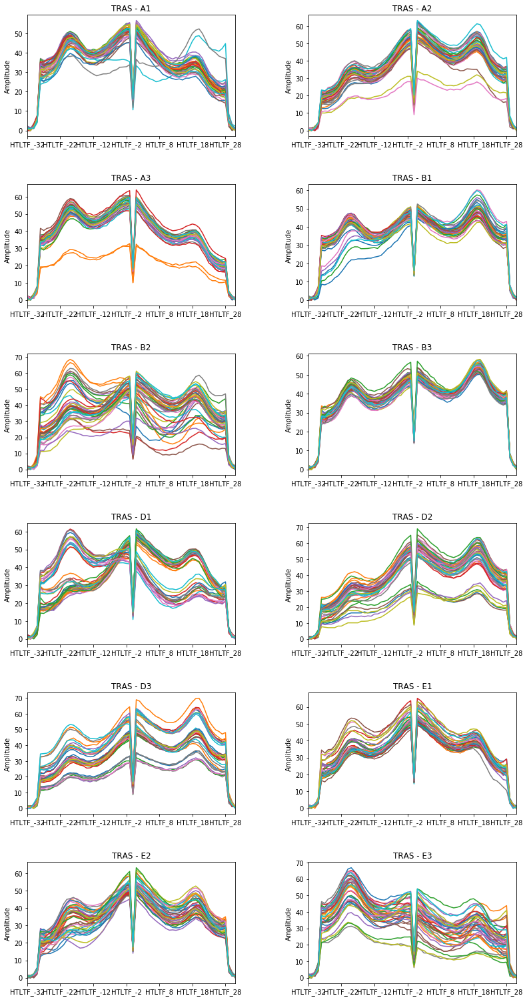

In [34]:
for w in organized_csi_df["device"].unique():
    data = organized_csi_df[organized_csi_df["device"]==w]
    data_A1 = data[data["local"]=="A1"]
    data_A2 = data[data["local"]=="A2"]
    data_A3 = data[data["local"]=="A3"]
    data_B1 = data[data["local"]=="B1"]
    data_B2 = data[data["local"]=="B2"]
    data_B3 = data[data["local"]=="B3"]
    data_D1 = data[data["local"]=="D1"]
    data_D2 = data[data["local"]=="D2"]
    data_D3 = data[data["local"]=="D3"]
    data_E1 = data[data["local"]=="E1"]
    data_E2 = data[data["local"]=="E2"]
    data_E3 = data[data["local"]=="E3"]
    fig, axes = plt.subplots(nrows=6, ncols=2,figsize=(12,24))
    for x in data_A1.index:
        data[data.columns[64:len(data.columns):1]].loc[x].plot(ax=axes[0,0])
    axes[0,0].set_ylabel("Amplitude")
    axes[0,0].set_title(w +" - A1")
    for x in data_A2.index:
        data[data.columns[64:len(data.columns):1]].loc[x].plot(ax=axes[0,1])
    axes[0,1].set_ylabel("Amplitude")
    axes[0,1].set_title(w +" - A2")
    for x in data_A3.index:
        data[data.columns[64:len(data.columns):1]].loc[x].plot(ax=axes[1,0])
    axes[1,0].set_ylabel("Amplitude")
    axes[1,0].set_title(w +" - A3")
    for x in data_B1.index:
        data[data.columns[64:len(data.columns):1]].loc[x].plot(ax=axes[1,1])
    axes[1,1].set_ylabel("Amplitude")
    axes[1,1].set_title(w +" - B1")
    for x in data_B2.index:
        data[data.columns[64:len(data.columns):1]].loc[x].plot(ax=axes[2,0])
    axes[2,0].set_ylabel("Amplitude")
    axes[2,0].set_title(w +" - B2")
    for x in data_B3.index:
        data[data.columns[64:len(data.columns):1]].loc[x].plot(ax=axes[2,1])
    axes[2,1].set_ylabel("Amplitude")
    axes[2,1].set_title(w +" - B3")
    for x in data_D1.index:
        data[data.columns[64:len(data.columns):1]].loc[x].plot(ax=axes[3,0])
    axes[3,0].set_ylabel("Amplitude")
    axes[3,0].set_title(w +" - D1")
    for x in data_D2.index:
        data[data.columns[64:len(data.columns):1]].loc[x].plot(ax=axes[3,1])
    axes[3,1].set_ylabel("Amplitude")
    axes[3,1].set_title(w +" - D2")
    for x in data_D3.index:
        data[data.columns[64:len(data.columns):1]].loc[x].plot(ax=axes[4,0])
    axes[4,0].set_ylabel("Amplitude")
    axes[4,0].set_title(w +" - D3")
    for x in data_E1.index:
        data[data.columns[64:len(data.columns):1]].loc[x].plot(ax=axes[4,1])
    axes[4,1].set_ylabel("Amplitude")
    axes[4,1].set_title(w +" - E1")
    for x in data_E2.index:
        data[data.columns[64:len(data.columns):1]].loc[x].plot(ax=axes[5,0])
    axes[5,0].set_ylabel("Amplitude")
    axes[5,0].set_title(w +" - E2")
    for x in data_E3.index:
        data[data.columns[64:len(data.columns):1]].loc[x].plot(ax=axes[5,1])
    axes[5,1].set_ylabel("Amplitude")
    axes[5,1].set_title(w +" - E3")
    plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=0.95, hspace=0.4,
                    wspace=0.35)

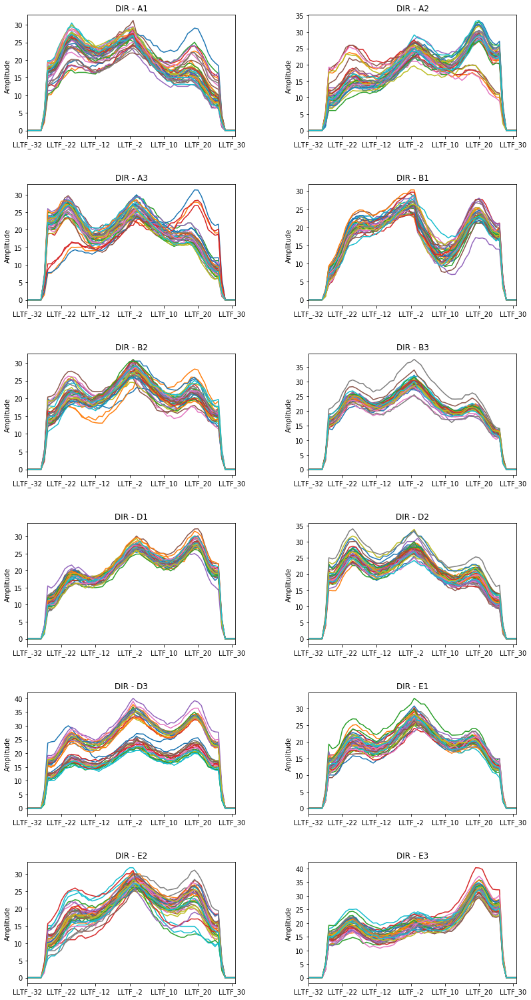

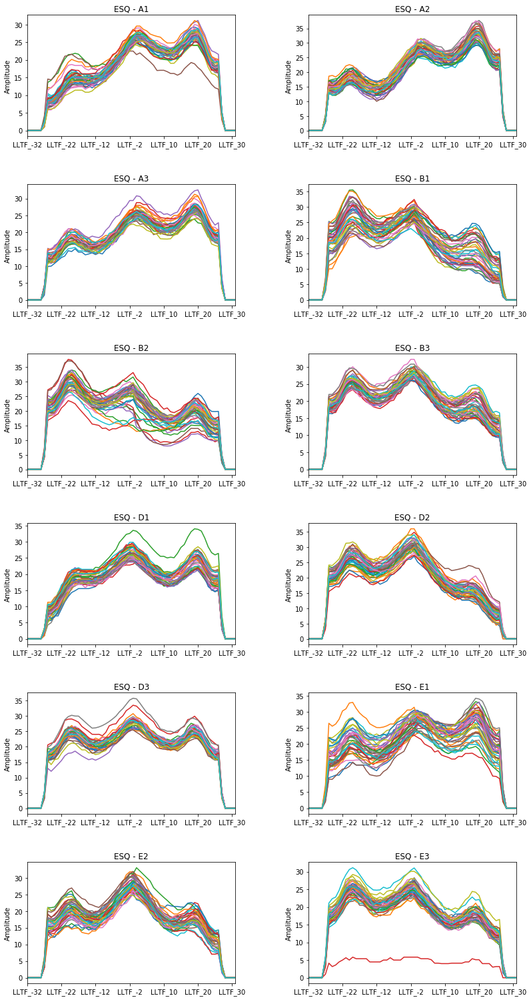

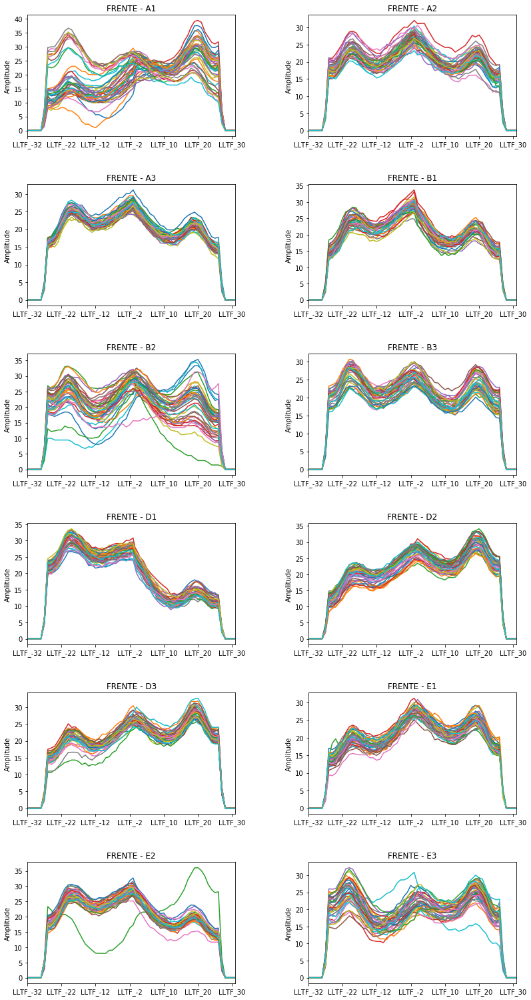

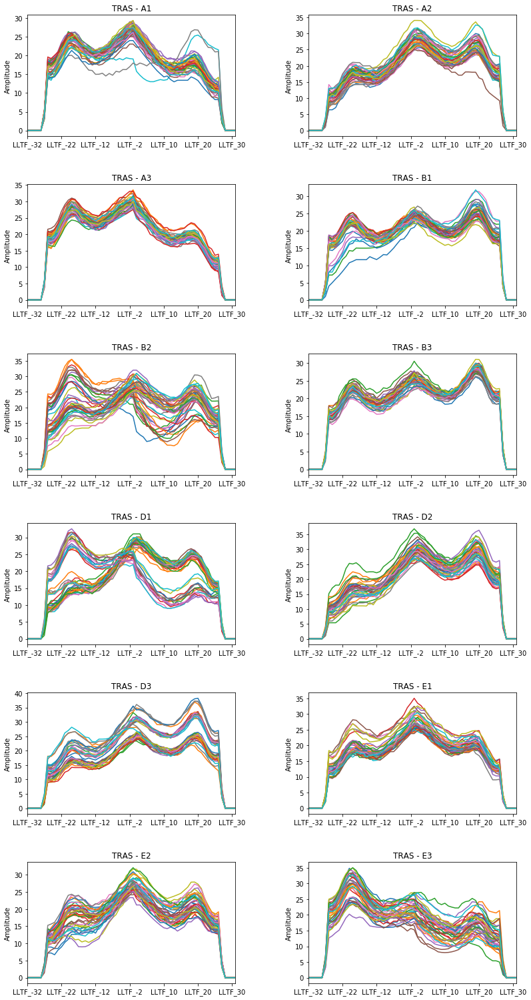

In [35]:
for w in organized_csi_df["device"].unique():
    data = organized_csi_df[organized_csi_df["device"]==w]
    data_A1 = data[data["local"]=="A1"]
    data_A2 = data[data["local"]=="A2"]
    data_A3 = data[data["local"]=="A3"]
    data_B1 = data[data["local"]=="B1"]
    data_B2 = data[data["local"]=="B2"]
    data_B3 = data[data["local"]=="B3"]
    data_D1 = data[data["local"]=="D1"]
    data_D2 = data[data["local"]=="D2"]
    data_D3 = data[data["local"]=="D3"]
    data_E1 = data[data["local"]=="E1"]
    data_E2 = data[data["local"]=="E2"]
    data_E3 = data[data["local"]=="E3"]
    fig, axes = plt.subplots(nrows=6, ncols=2,figsize=(12,24))
    for x in data_A1.index:
        data[data.columns[2:64:1]].loc[x].plot(ax=axes[0,0])
    axes[0,0].set_ylabel("Amplitude")
    axes[0,0].set_title(w +" - A1")
    for x in data_A2.index:
        data[data.columns[2:64:1]].loc[x].plot(ax=axes[0,1])
    axes[0,1].set_ylabel("Amplitude")
    axes[0,1].set_title(w +" - A2")
    for x in data_A3.index:
        data[data.columns[2:64:1]].loc[x].plot(ax=axes[1,0])
    axes[1,0].set_ylabel("Amplitude")
    axes[1,0].set_title(w +" - A3")
    for x in data_B1.index:
        data[data.columns[2:64:1]].loc[x].plot(ax=axes[1,1])
    axes[1,1].set_ylabel("Amplitude")
    axes[1,1].set_title(w +" - B1")
    for x in data_B2.index:
        data[data.columns[2:64:1]].loc[x].plot(ax=axes[2,0])
    axes[2,0].set_ylabel("Amplitude")
    axes[2,0].set_title(w +" - B2")
    for x in data_B3.index:
        data[data.columns[2:64:1]].loc[x].plot(ax=axes[2,1])
    axes[2,1].set_ylabel("Amplitude")
    axes[2,1].set_title(w +" - B3")
    for x in data_D1.index:
        data[data.columns[2:64:1]].loc[x].plot(ax=axes[3,0])
    axes[3,0].set_ylabel("Amplitude")
    axes[3,0].set_title(w +" - D1")
    for x in data_D2.index:
        data[data.columns[2:64:1]].loc[x].plot(ax=axes[3,1])
    axes[3,1].set_ylabel("Amplitude")
    axes[3,1].set_title(w +" - D2")
    for x in data_D3.index:
        data[data.columns[2:64:1]].loc[x].plot(ax=axes[4,0])
    axes[4,0].set_ylabel("Amplitude")
    axes[4,0].set_title(w +" - D3")
    for x in data_E1.index:
        data[data.columns[2:64:1]].loc[x].plot(ax=axes[4,1])
    axes[4,1].set_ylabel("Amplitude")
    axes[4,1].set_title(w +" - E1")
    for x in data_E2.index:
        data[data.columns[2:64:1]].loc[x].plot(ax=axes[5,0])
    axes[5,0].set_ylabel("Amplitude")
    axes[5,0].set_title(w +" - E2")
    for x in data_E3.index:
        data[data.columns[2:64:1]].loc[x].plot(ax=axes[5,1])
    axes[5,1].set_ylabel("Amplitude")
    axes[5,1].set_title(w +" - E3")
    plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=0.95, hspace=0.4,
                    wspace=0.35)

In [36]:
organized_csi_df['x'] = 0
organized_csi_df['y'] = 0

In [44]:
for x in organized_csi_df.index:
    if organized_csi_df["local"].loc[x]=="A1":
        organized_csi_df['x'][x] = 1
        organized_csi_df['y'][x] = 3
    if organized_csi_df["local"].loc[x]=="A2":
        organized_csi_df['x'][x] = 1
        organized_csi_df['y'][x] = 2
    if organized_csi_df["local"].loc[x]=="A3":
        organized_csi_df['x'][x] = 1
        organized_csi_df['y'][x] = 1
    if organized_csi_df["local"].loc[x]=="B1":
        organized_csi_df['x'][x] = 2
        organized_csi_df['y'][x] = 3
    if organized_csi_df["local"].loc[x]=="B2":
        organized_csi_df['x'][x] = 2
        organized_csi_df['y'][x] = 2
    if organized_csi_df["local"].loc[x]=="B3":
        organized_csi_df['x'][x] = 2
        organized_csi_df['y'][x] = 1
    if organized_csi_df["local"].loc[x]=="D1":
        organized_csi_df['x'][x] = 3
        organized_csi_df['y'][x] = 3
    if organized_csi_df["local"].loc[x]=="D2":
        organized_csi_df['x'][x] = 3
        organized_csi_df['y'][x] = 2
    if organized_csi_df["local"].loc[x]=="D3":
        organized_csi_df['x'][x] = 3
        organized_csi_df['y'][x] = 1
    if organized_csi_df["local"].loc[x]=="E1":
        organized_csi_df['x'][x] = 4
        organized_csi_df['y'][x] = 3
    if organized_csi_df["local"].loc[x]=="E2":
        organized_csi_df['x'][x] = 4
        organized_csi_df['y'][x] = 2
    if organized_csi_df["local"].loc[x]=="E3":
        organized_csi_df['x'][x] = 4
        organized_csi_df['y'][x] = 1


C:\Users\iande\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\iande\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
C:\Users\iande\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if sys.path[0] == '':
C:\User

In [48]:
organized_csi_df[organized_csi_df["local"]=="B2"].head()

,device,local,LLTF_-32,LLTF_-31,LLTF_-30,LLTF_-29,LLTF_-28,LLTF_-27,LLTF_-26,LLTF_-25,...,HTLTF_24,HTLTF_25,HTLTF_26,HTLTF_27,HTLTF_28,HTLTF_29,HTLTF_30,HTLTF_31,x,y
80,DIR,B2,0,0,0,0,0,5.000000,19.849433,19.209373,...,33.734256,31.320920,29.546573,29.068884,29.410882,5.385165,2.000000,1.414214,2,2
81,DIR,B2,0,0,0,0,0,3.162278,15.033296,14.000000,...,35.383612,33.600595,32.649655,30.805844,31.000000,5.000000,1.000000,1.000000,2,2
82,DIR,B2,0,0,0,0,0,4.123106,15.524175,16.278821,...,30.000000,28.160256,26.683328,25.553865,26.172505,5.000000,1.414214,1.000000,2,2
83,DIR,B2,0,0,0,0,0,5.099020,17.720045,18.681542,...,31.384710,30.364453,29.274562,27.459060,28.635642,5.830952,2.828427,1.000000,2,2
84,DIR,B2,0,0,0,0,0,5.000000,18.601075,19.209373,...,32.756679,30.805844,29.698485,28.178006,28.635642,6.082763,2.000000,0.000000,2,2


In [55]:
#Escrever no excell
#Esse arquivo criado já tem as amplitudes das subportadoras já ordenadas corretamente, as posições e está pronto para ser utilizado!
organized_csi_df=organized_csi_df[["device","local","x","y","LLTF_-32","LLTF_-31","LLTF_-30","LLTF_-29","LLTF_-28","LLTF_-27","LLTF_-26","LLTF_-25","LLTF_-24","LLTF_-23","LLTF_-22","LLTF_-21","LLTF_-20","LLTF_-19","LLTF_-18","LLTF_-17","LLTF_-16","LLTF_-15","LLTF_-14","LLTF_-13","LLTF_-12","LLTF_-11","LLTF_-10","LLTF_-9","LLTF_-8","LLTF_-7","LLTF_-6","LLTF_-5","LLTF_-4","LLTF_-3","LLTF_-2","LLTF_-1","LLTF_2","LLTF_3","LLTF_4","LLTF_5","LLTF_6","LLTF_7","LLTF_8","LLTF_9","LLTF_10","LLTF_11","LLTF_12","LLTF_13","LLTF_14","LLTF_15","LLTF_16","LLTF_17","LLTF_18","LLTF_19","LLTF_20","LLTF_21","LLTF_22","LLTF_23","LLTF_24","LLTF_25","LLTF_26","LLTF_27","LLTF_28","LLTF_29","LLTF_30","LLTF_31","HTLTF_-32","HTLTF_-31","HTLTF_-30","HTLTF_-29","HTLTF_-28","HTLTF_-27","HTLTF_-26","HTLTF_-25","HTLTF_-24","HTLTF_-23","HTLTF_-22","HTLTF_-21","HTLTF_-20","HTLTF_-19","HTLTF_-18","HTLTF_-17","HTLTF_-16","HTLTF_-15","HTLTF_-14","HTLTF_-13","HTLTF_-12","HTLTF_-11","HTLTF_-10","HTLTF_-9","HTLTF_-8","HTLTF_-7","HTLTF_-6","HTLTF_-5","HTLTF_-4","HTLTF_-3","HTLTF_-2","HTLTF_-1","HTLTF_0","HTLTF_1","HTLTF_2","HTLTF_3","HTLTF_4","HTLTF_5","HTLTF_6","HTLTF_7","HTLTF_8","HTLTF_9","HTLTF_10","HTLTF_11","HTLTF_12","HTLTF_13","HTLTF_14","HTLTF_15","HTLTF_16","HTLTF_17","HTLTF_18","HTLTF_19","HTLTF_20","HTLTF_21","HTLTF_22","HTLTF_23","HTLTF_24","HTLTF_25","HTLTF_26","HTLTF_27","HTLTF_28","HTLTF_29","HTLTF_30","HTLTF_31"]]
organized_csi_df.to_excel("subcarriers_amplitude_position.xlsx", sheet_name="subcarriers_amplitude_position")

In [58]:
organized_csi_df = pd.read_excel("subcarriers_amplitude_position.xlsx", sheet_name="subcarriers_amplitude_position")
organized_csi_df.drop("Unnamed: 0",axis=1,inplace=True)

In [59]:
organized_csi_df.head()

,device,local,x,y,LLTF_-32,LLTF_-31,LLTF_-30,LLTF_-29,LLTF_-28,LLTF_-27,...,HTLTF_22,HTLTF_23,HTLTF_24,HTLTF_25,HTLTF_26,HTLTF_27,HTLTF_28,HTLTF_29,HTLTF_30,HTLTF_31
0,DIR,A1,1,3,0,0,0,0,0,4.123106,...,22.090722,19.000000,17.029386,15.132746,14.560220,12.806248,13.601471,2.236068,0.000000,1.414214
1,DIR,A1,1,3,0,0,0,0,0,5.000000,...,24.083189,22.203603,19.416488,17.720045,17.464249,15.620499,15.000000,3.605551,2.236068,0.000000
2,DIR,A1,1,3,0,0,0,0,0,4.000000,...,21.023796,18.110770,17.464249,15.811388,14.317821,13.453624,12.806248,2.236068,1.000000,1.414214
3,DIR,A1,1,3,0,0,0,0,0,4.123106,...,21.954498,19.416488,17.029386,15.556349,15.000000,12.649111,12.041595,2.000000,0.000000,1.000000
4,DIR,A1,1,3,0,0,0,0,0,3.162278,...,20.000000,17.492856,15.231546,13.601471,13.152946,13.038405,12.369317,2.236068,1.000000,1.414214


In [88]:
organized_csi_df.columns[4:66:1]

Index(['LLTF_-32', 'LLTF_-31', 'LLTF_-30', 'LLTF_-29', 'LLTF_-28', 'LLTF_-27',
       'LLTF_-26', 'LLTF_-25', 'LLTF_-24', 'LLTF_-23', 'LLTF_-22', 'LLTF_-21',
       'LLTF_-20', 'LLTF_-19', 'LLTF_-18', 'LLTF_-17', 'LLTF_-16', 'LLTF_-15',
       'LLTF_-14', 'LLTF_-13', 'LLTF_-12', 'LLTF_-11', 'LLTF_-10', 'LLTF_-9',
       'LLTF_-8', 'LLTF_-7', 'LLTF_-6', 'LLTF_-5', 'LLTF_-4', 'LLTF_-3',
       'LLTF_-2', 'LLTF_-1', 'LLTF_2', 'LLTF_3', 'LLTF_4', 'LLTF_5', 'LLTF_6',
       'LLTF_7', 'LLTF_8', 'LLTF_9', 'LLTF_10', 'LLTF_11', 'LLTF_12',
       'LLTF_13', 'LLTF_14', 'LLTF_15', 'LLTF_16', 'LLTF_17', 'LLTF_18',
       'LLTF_19', 'LLTF_20', 'LLTF_21', 'LLTF_22', 'LLTF_23', 'LLTF_24',
       'LLTF_25', 'LLTF_26', 'LLTF_27', 'LLTF_28', 'LLTF_29', 'LLTF_30',
       'LLTF_31'],
      dtype='object')

In [121]:
organized_csi_df["P_DBM_LLTF"] = 0
for x in organized_csi_df.index:
    soma = 0
    n = 0
    nulos = 0
    for y in organized_csi_df.columns[4:66:1]:
        if organized_csi_df[y][x]==0:
            nulos += 1
        else:
            soma += organized_csi_df[y][x]
            n+=1
#     print("soma amplitudes:" + soma)
#     print("n não nulos:" + n)
#     print("nulos:" + nulos)
    rssi = soma/n
#     print("rssi médio:" + rssi)
    organized_csi_df["P_DBM_LLTF"].loc[x] = rssi
                

C:\Users\iande\Anaconda3\lib\site-packages\pandas\core\indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [122]:
organized_csi_df["P_DBM_HTLTF"] = 0
for x in organized_csi_df.index:
    soma = 0
    n = 0
    nulos = 0
    for y in organized_csi_df.columns[66:130:1]:
        if organized_csi_df[y][x]==0:
            nulos += 1
        else:
            soma += organized_csi_df[y][x]
            n+=1
#     print("soma amplitudes:" + soma)
#     print("n não nulos:" + n)
#     print("nulos:" + nulos)
    rssi = soma/n
#     print("rssi médio:" + rssi)
    organized_csi_df["P_DBM_HTLTF"].loc[x] = rssi

In [123]:
organized_csi_df.head()

,device,local,x,y,LLTF_-32,LLTF_-31,LLTF_-30,LLTF_-29,LLTF_-28,LLTF_-27,...,HTLTF_24,HTLTF_25,HTLTF_26,HTLTF_27,HTLTF_28,HTLTF_29,HTLTF_30,HTLTF_31,P_DBM_LLTF,P_DBM_HTLTF
0,DIR,A1,1,3,0,0,0,0,0,4.123106,...,17.029386,15.132746,14.560220,12.806248,13.601471,2.236068,0.000000,1.414214,18.326305,32.462711
1,DIR,A1,1,3,0,0,0,0,0,5.000000,...,19.416488,17.720045,17.464249,15.620499,15.000000,3.605551,2.236068,0.000000,19.625982,34.627993
2,DIR,A1,1,3,0,0,0,0,0,4.000000,...,17.464249,15.811388,14.317821,13.453624,12.806248,2.236068,1.000000,1.414214,19.009755,32.599737
3,DIR,A1,1,3,0,0,0,0,0,4.123106,...,17.029386,15.556349,15.000000,12.649111,12.041595,2.000000,0.000000,1.000000,19.157725,33.949590
4,DIR,A1,1,3,0,0,0,0,0,3.162278,...,15.231546,13.601471,13.152946,13.038405,12.369317,2.236068,1.000000,1.414214,16.433430,28.670187


In [124]:
organized_csi_df["P_MW_LLTF"] = 0
organized_csi_df["P_MW_HTLTF"] = 0
for x in organized_csi_df.index:
    organized_csi_df["P_MW_LLTF"][x] = 10**(organized_csi_df["P_DBM_LLTF"][x]/10)
    organized_csi_df["P_MW_HTLTF"][x] = 10**(organized_csi_df["P_DBM_HTLTF"][x]/10)

C:\Users\iande\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
C:\Users\iande\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


In [125]:
organized_csi_df.head()

,device,local,x,y,LLTF_-32,LLTF_-31,LLTF_-30,LLTF_-29,LLTF_-28,LLTF_-27,...,HTLTF_26,HTLTF_27,HTLTF_28,HTLTF_29,HTLTF_30,HTLTF_31,P_DBM_LLTF,P_DBM_HTLTF,P_MW_LLTF,P_MW_HTLTF
0,DIR,A1,1,3,0,0,0,0,0,4.123106,...,14.560220,12.806248,13.601471,2.236068,0.000000,1.414214,18.326305,32.462711,68,1763
1,DIR,A1,1,3,0,0,0,0,0,5.000000,...,17.464249,15.620499,15.000000,3.605551,2.236068,0.000000,19.625982,34.627993,91,2902
2,DIR,A1,1,3,0,0,0,0,0,4.000000,...,14.317821,13.453624,12.806248,2.236068,1.000000,1.414214,19.009755,32.599737,79,1819
3,DIR,A1,1,3,0,0,0,0,0,4.123106,...,15.000000,12.649111,12.041595,2.000000,0.000000,1.000000,19.157725,33.949590,82,2482
4,DIR,A1,1,3,0,0,0,0,0,3.162278,...,13.152946,13.038405,12.369317,2.236068,1.000000,1.414214,16.433430,28.670187,43,736


In [129]:
organized_csi_df=organized_csi_df[["device","local","x","y","P_MW_LLTF","P_MW_HTLTF","P_DBM_LLTF","P_DBM_HTLTF","LLTF_-32","LLTF_-31","LLTF_-30","LLTF_-29","LLTF_-28","LLTF_-27","LLTF_-26","LLTF_-25","LLTF_-24","LLTF_-23","LLTF_-22","LLTF_-21","LLTF_-20","LLTF_-19","LLTF_-18","LLTF_-17","LLTF_-16","LLTF_-15","LLTF_-14","LLTF_-13","LLTF_-12","LLTF_-11","LLTF_-10","LLTF_-9","LLTF_-8","LLTF_-7","LLTF_-6","LLTF_-5","LLTF_-4","LLTF_-3","LLTF_-2","LLTF_-1","LLTF_2","LLTF_3","LLTF_4","LLTF_5","LLTF_6","LLTF_7","LLTF_8","LLTF_9","LLTF_10","LLTF_11","LLTF_12","LLTF_13","LLTF_14","LLTF_15","LLTF_16","LLTF_17","LLTF_18","LLTF_19","LLTF_20","LLTF_21","LLTF_22","LLTF_23","LLTF_24","LLTF_25","LLTF_26","LLTF_27","LLTF_28","LLTF_29","LLTF_30","LLTF_31","HTLTF_-32","HTLTF_-31","HTLTF_-30","HTLTF_-29","HTLTF_-28","HTLTF_-27","HTLTF_-26","HTLTF_-25","HTLTF_-24","HTLTF_-23","HTLTF_-22","HTLTF_-21","HTLTF_-20","HTLTF_-19","HTLTF_-18","HTLTF_-17","HTLTF_-16","HTLTF_-15","HTLTF_-14","HTLTF_-13","HTLTF_-12","HTLTF_-11","HTLTF_-10","HTLTF_-9","HTLTF_-8","HTLTF_-7","HTLTF_-6","HTLTF_-5","HTLTF_-4","HTLTF_-3","HTLTF_-2","HTLTF_-1","HTLTF_0","HTLTF_1","HTLTF_2","HTLTF_3","HTLTF_4","HTLTF_5","HTLTF_6","HTLTF_7","HTLTF_8","HTLTF_9","HTLTF_10","HTLTF_11","HTLTF_12","HTLTF_13","HTLTF_14","HTLTF_15","HTLTF_16","HTLTF_17","HTLTF_18","HTLTF_19","HTLTF_20","HTLTF_21","HTLTF_22","HTLTF_23","HTLTF_24","HTLTF_25","HTLTF_26","HTLTF_27","HTLTF_28","HTLTF_29","HTLTF_30","HTLTF_31"]]
organized_csi_df.to_excel("subcarriers_amp_pos_pot.xlsx", sheet_name="subcarriers_amp_pos_pot")